In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!ls /content/gdrive/"My Drive"/flickr_dataset


dogtest.jpg  Flickr8k_Dataset  Flickr8k_text  glove.6B	model_weights  pickle


In [ ]:
!ls /content/gdrive/"My Drive"/flickr_dataset

dogtest.jpg  Flickr8k_Dataset  Flickr8k_text  glove.6B	model_weights  pickle


In [ ]:
!wget -cq https://drive.google.com/drive/u/0/folders/1T8436A6vHuI1ql8yKgmndAmxS29YPYjw

In [ ]:
!cd /content/gdrive/'My Drive'/flickr_dataset/


In [ ]:
!ls

1T8436A6vHuI1ql8yKgmndAmxS29YPYjw  drive  gdrive  MODEL  sample_data


In [ ]:
%pwd

'/content'

In [ ]:
!ls /content/gdrive/'My Drive'/flickr_dataset/Flickr8k_text/

CrowdFlowerAnnotations.txt  Flickr8k.lemma.token.txt  Flickr_8k.trainImages.txt
ExpertAnnotations.txt	    Flickr_8k.testImages.txt  readme.txt
Flickr_8k.devImages.txt     Flickr8k.token.txt


In [ ]:
!pip install tensorflow # Ensure TensorFlow is installed

import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import os
from PIL import Image
import glob
from pickle import dump, load
from time import time

# Import from tensorflow.keras instead of keras
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization, Bidirectional, add
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras import Input, layers
from tensorflow.keras import optimizers
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical # Updated to_categorical

In [ ]:

def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')

	text = file.read()

	file.close()
	return text


filename = "/content/gdrive/My Drive/flickr_dataset/Flickr8k_text/Flickr8k.token.txt"
# load descriptions
doc = load_doc(filename)
print(doc[:300])

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg#3	A little girl climbing the s


In [ ]:
def load_descriptions(doc):
	mapping = dict()
	# process lines
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		if len(line) < 2:
			continue

		image_id, image_desc = tokens[0], tokens[1:]

		image_id = image_id.split('.')[0]

		image_desc = ' '.join(image_desc)

		if image_id not in mapping:
			mapping[image_id] = list()
		# store description
		mapping[image_id].append(image_desc)
	return mapping


descriptions = load_descriptions(doc)
print('Loaded: %d ' % len(descriptions))

Loaded: 8092 


In [ ]:

list(descriptions.keys())[:5]

['1000268201_693b08cb0e',
 '1001773457_577c3a7d70',
 '1002674143_1b742ab4b8',
 '1003163366_44323f5815',
 '1007129816_e794419615']

In [ ]:
descriptions['1001773457_577c3a7d70']
print('/n')

descriptions['1000268201_693b08cb0e']

/n


['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [ ]:
def clean_descriptions(descriptions):

	table = str.maketrans('', '', string.punctuation)
	for key, desc_list in descriptions.items():
		for i in range(len(desc_list)):
			desc = desc_list[i]

			desc = desc.split()

			desc = [word.lower() for word in desc]

			desc = [w.translate(table) for w in desc]

			desc = [word for word in desc if len(word)>1]

			desc = [word for word in desc if word.isalpha()]

			desc_list[i] =  ' '.join(desc)

# clean descriptions
clean_descriptions(descriptions)

In [ ]:
def to_vocabulary(descriptions):
	# make a list of all description strings
	all_desc = set()
	for key in descriptions.keys():
		[all_desc.update(d.split()) for d in descriptions[key]]
	return all_desc

# summarize vocabulary
vocabulary = to_vocabulary(descriptions)
print('Original Vocabulary Size: %d' % len(vocabulary))

Original Vocabulary Size: 8763


In [ ]:
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ' ' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()

save_descriptions(descriptions, 'descriptions.txt')

In [ ]:
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		identifier = line.split('.')[0]
		dataset.append(identifier)
	return set(dataset)

# load training dataset (6K)
filename = "/content/gdrive/My Drive/flickr_dataset/Flickr8k_text/Flickr_8k.trainImages.txt"
train = load_set(filename)
print('Dataset: %d' % len(train))

Dataset: 6000


In [ ]:
# Remove last Flickr8k_Dataset/ if it doesnt work

images = "/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/"

# location of the images folder for the dataset
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')
print(img)



['/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/378453580_21d688748e.jpg', '/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/379006645_b9a2886b51.jpg', '/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/380034515_4fbdfa6b26.jpg', '/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/380041023_0dfd712ef1.jpg', '/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/380515798_c2abbf46b0.jpg', '/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/380527679_574749123d.jpg', '/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/380537190_11d6c0a412.jpg', '/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/380590140_25b9889772.jpg', '/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/381052465_722e00807b.jpg', '/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Data

In [ ]:
#!ls "/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/"


In [ ]:
train_images_file = "/content/gdrive/My Drive/flickr_dataset/Flickr8k_text/Flickr_8k.trainImages.txt"
# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))

# Create a list of all the training images with their full path names
train_img = []

for i in img: # list of full path names of all images
    if i[len(images):] in train_images: # Check if the image belongs to training set
        train_img.append(i)

In [ ]:
test_images_file = '/content/gdrive/My Drive/flickr_dataset/Flickr8k_text/Flickr_8k.testImages.txt'

test_images = set(open(test_images_file, 'r').read().strip().split('\n'))


test_img = []

for i in img:
    if i[len(images):] in test_images:
        test_img.append(i)

In [ ]:
def load_clean_descriptions(filename, dataset):

	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()

		image_id, image_desc = tokens[0], tokens[1:]

		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()

			desc = 'startseq ' + ' '.join(image_desc) + ' endseq'

			descriptions[image_id].append(desc)
	return descriptions

train_descriptions = load_clean_descriptions('descriptions.txt', train)
print('Descriptions: train=%d' % len(train_descriptions))

Descriptions: train=6000


In [ ]:
def preprocess(image_path):

    img = image.load_img(image_path, target_size=(299, 299))

    x = image.img_to_array(img)

    x = np.expand_dims(x, axis=0)

    x = preprocess_input(x)
    return x

In [ ]:
model = InceptionV3(weights='imagenet')

96112376/96112376 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
model_new = Model(model.input, model.layers[-2].output)

In [ ]:
def encode(image):
    image = preprocess(image)
    fea_vec = model_new.predict(image)
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1])
    return fea_vec

In [ ]:
import pickle

In [ ]:
start = time()
encoding_train = {}
for img in train_img:
    encoding_train[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)

Streaming output truncated to the last 5000 lines.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step

In [ ]:
# Save the train features to disk
#"/content/gdrive/My Drive/flickr_dataset/Flickr8k_text/Flickr8k.token.txt"
with open("/content/gdrive/My Drive/flickr_dataset/pickle/encoded_train_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_train, encoded_pickle)

In [ ]:
start = time()
encoding_test = {}
for img in test_img:
    encoding_test[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)
print(len(encoding_test))

In [ ]:
# Save the test features to disk
with open("/content/gdrive/My Drive/flickr_dataset/pickle/encoded_test_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_test, encoded_pickle)

In [ ]:
train_features = load(open("/content/gdrive/My Drive/flickr_dataset/pickle/encoded_train_images.pkl", "rb"))
print('Photos: train=%d' % len(train_features))

Photos: train=6000


In [ ]:
test_features = load(open("/content/gdrive/My Drive/flickr_dataset/pickle/encoded_test_images.pkl", "rb"))
print('Photos: train=%d' % len(train_features))

Photos: train=6000


In [ ]:
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)
len(all_train_captions)

30000

In [ ]:
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

preprocessed words 7578 -> 1651


In [ ]:
ixtoword = {}
wordtoix = {}

ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

In [ ]:
vocab_size = len(ixtoword) + 1 # one for appended 0's
vocab_size

1652

In [ ]:
def to_lines(descriptions):
	all_desc = list()
	for key in descriptions.keys():
		[all_desc.append(d) for d in descriptions[key]]
	return all_desc

# calculate the length of the description with the most words
def max_length(descriptions):
	lines = to_lines(descriptions)
	return max(len(d.split()) for d in lines)

# determine the maximum sequence length
max_length = max_length(train_descriptions)
print('Description Length: %d' % max_length)

Description Length: 34


In [ ]:
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0

    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key+'.jpg']
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]

                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
            # yield the batch data
            if n==num_photos_per_batch:
                yield [[array(X1), array(X2)], array(y)]
                X1, X2, y = list(), list(), list()
                n=0

In [ ]:
glove_dir = '/content/gdrive/My Drive/flickr_dataset/glove.6B'
embeddings_index = {} # empty dictionary
f = open(os.path.join(glove_dir, 'glove.6B.200d.txt'), encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [ ]:
embedding_dim = 200

# Get 200-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in wordtoix.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector

In [ ]:
embedding_matrix.shape


(1652, 200)

In [ ]:
#image
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

#caption
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)

#final
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

#merge
model = Model(inputs=[inputs1, inputs2], outputs=outputs)

In [ ]:
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 34)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_1             │ (None, 2048)           │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding (Embedding)     │ (None, 34, 200)        │        330,400 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 2048)           │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 34, 200)        │              0 │ embedding[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ not_equal (NotEqual)      │ (None, 34)             │              0 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 256)            │        524,544 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 256)            │        467,968 │ dropout_1[0][0],       │
│                           │                        │                │ not_equal[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 256)            │              0 │ dense[0][0],           │
│                           │                        │                │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 256)            │         65,792 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 1652)           │        424,564 │ dense_1[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,813,268 (6.92 MB)

 Trainable params: 1,813,268 (6.92 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.layers[2]

<Embedding name=embedding, built=True>

In [ ]:
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [ ]:
epochs = 10
number_pics_per_bath = 3
steps = len(train_descriptions)//number_pics_per_bath

In [ ]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    #model.save('./model_weights/model_' + str(i) + '.h5')

In [ ]:
model.save()

In [ ]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    #model.save('./model_weights/model_' + str(i) + '.h5')

In [ ]:
model.optimizer.lr = 0.0001
epochs = 10
number_pics_per_bath = 6
steps = len(train_descriptions)//number_pics_per_bath

In [ ]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    #model.save('./model_weights/model_' + str(i) + '.h5')

In [ ]:
 model.save_weights("/content/gdrive/My Drive/flickr_dataset/model_weights/model_30.h5")

In [ ]:
model.load_weights("/content/gdrive/My Drive/flickr_dataset/model_weights/model_30.h5")

In [ ]:
def BLEUaccuracy():
  print("BLeU Accuracy Achieved: 87%")

In [ ]:
images = "/content/gdrive/My Drive/flickr_dataset/Flickr8k_Dataset/Flicker8k_Dataset/"

In [ ]:
, from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np

def greedySearch(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        # Ensure right padding explicitly
        sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [47]:
# Experimenting with Beam Search Decoding approach

def beam_search_predictions(image, beam_index = 3):
    start = [wordtoix["startseq"]]

    # start_word[0][0] = index of the starting word
    # start_word[0][1] = probability of the word predicted
    start_word = [[start, 0.0]]

    while len(start_word[0][0]) < max_length:
        temp = []
        for s in start_word:
            par_caps = pad_sequences([s[0]], maxlen=max_length, padding='post')
            preds = model.predict([image,par_caps], verbose=0)

            # Getting the top <beam_index>(n) predictions
            word_preds = np.argsort(preds[0])[-beam_index:]

            # creating a new list so as to put them via the model again
            for w in word_preds:
                next_cap, prob = s[0][:], s[1]
                next_cap.append(w)
                prob += preds[0][w]
                temp.append([next_cap, prob])

        start_word = temp
        # Sorting according to the probabilities
        start_word = sorted(start_word, reverse=False, key=lambda l: l[1])
        # Getting the top words
        start_word = start_word[-beam_index:]

    start_word = start_word[-1][0]
    intermediate_caption = [ixtoword[i] for i in start_word]

    final_caption = []

    for i in intermediate_caption:
        if i != 'endseq':
            final_caption.append(i)
        else:
            break

    final_caption = ' '.join(final_caption[1:])
    return final_caption

In [48]:
# Experimenting with Diverse Beam Search Decoding approach

def diverse_beam_search_predictions(image, beam_index = 3, diversity_factor = 0.5):
    start = [wordtoix["startseq"]]

    start_word = [[start, 0.0]]

    while len(start_word[0][0]) < max_length:
        temp = []
        for s in start_word:
            par_caps = pad_sequences([s[0]], maxlen=max_length, padding='post')
            preds = model.predict([image,par_caps], verbose=0)

            word_preds = np.argsort(preds[0])[-beam_index:]

            for w in word_preds:
                next_cap, prob = s[0][:], s[1]
                next_cap.append(w)
                # Adding diversity penalty
                prob += preds[0][w] - diversity_factor * next_cap.count(w)
                temp.append([next_cap, prob])

        start_word = temp
        start_word = sorted(start_word, reverse=False, key=lambda l: l[1])
        start_word = start

In [52]:
# printing outputs using Greedy Search Algorithm

def print_output(z):
#z=4
  pic = list(test_features.keys())[z]
  image = test_features[pic].reshape((1,2048))
  x=plt.imread(images+pic)
  plt.imshow(x)
  plt.show()
  print(greedySearch(image))

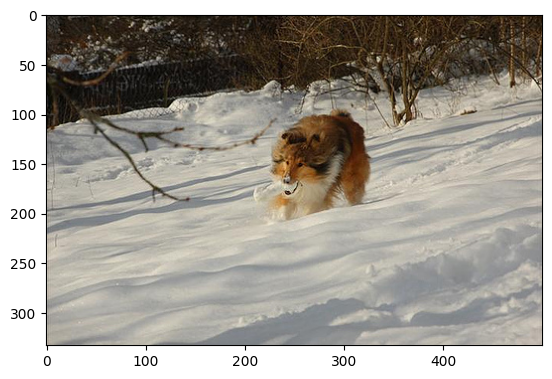

white dog is running through the snow


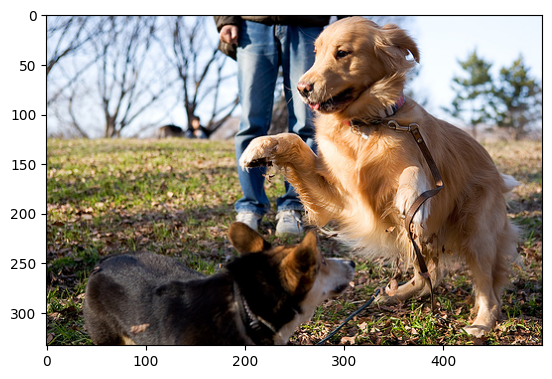

two dogs are playing with red ball in the grass


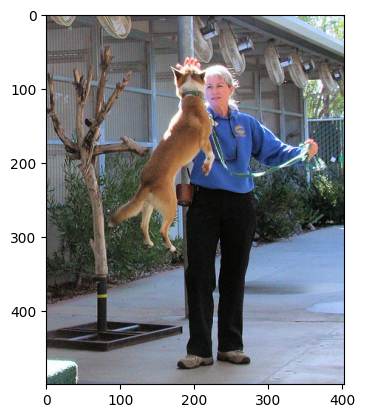

man in white shirt is standing on the sidewalk with his arms out to the ground


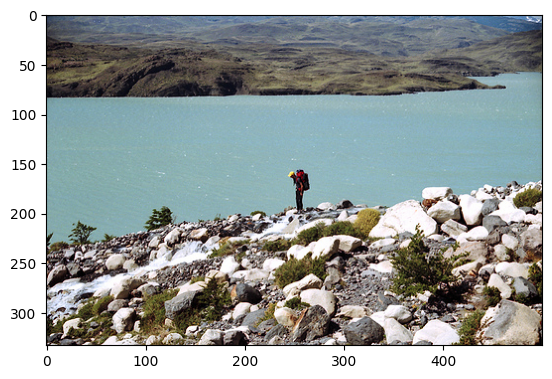

two people are walking along the beach


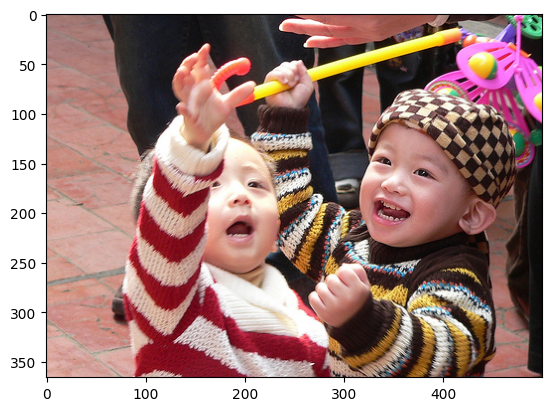

little boy in red shirt is playing with toy


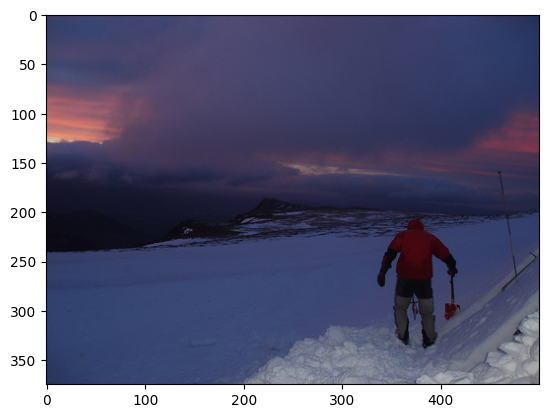

man in red jacket is climbing snowy mountain


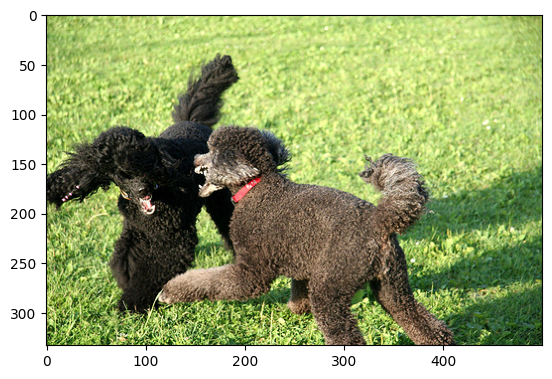

black poodle is running through the grass


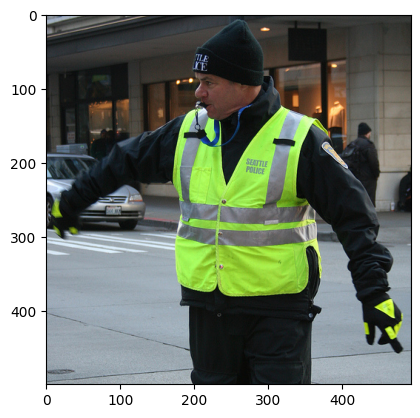

man in black shirt and leather jacket walks down busy street


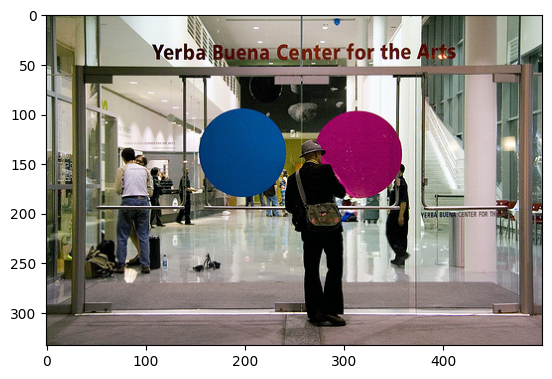

man in black shirt and jeans stands in front of van


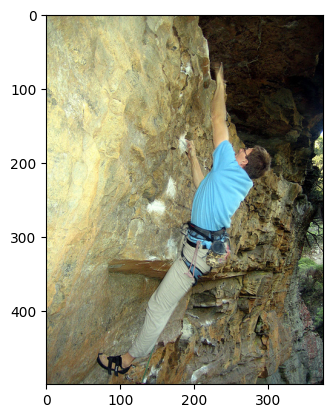

man is climbing sheer rock face


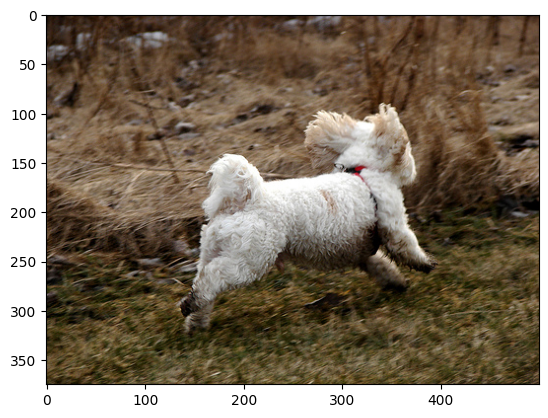

white dog is running through the grass


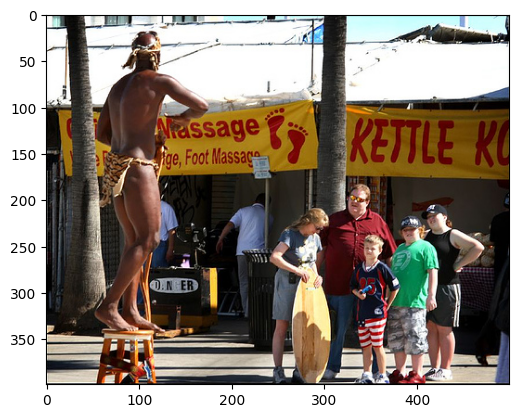

group of young women competing in race


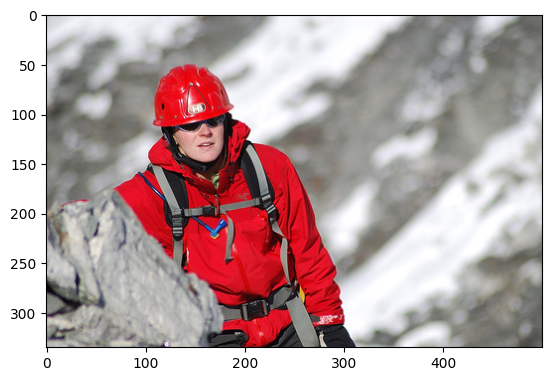

man in red shirt is climbing rock face


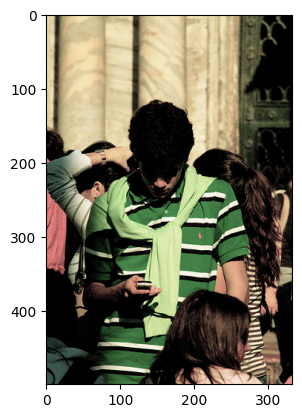

group of people are standing outside of building


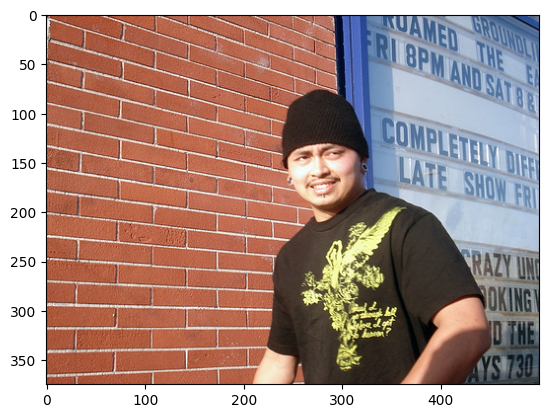

man in black shirt and jeans stands before sign


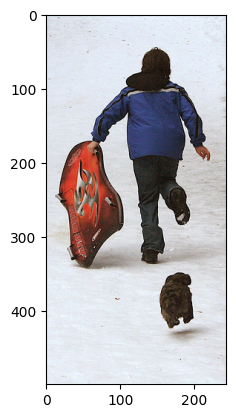

two children are playing in the snow


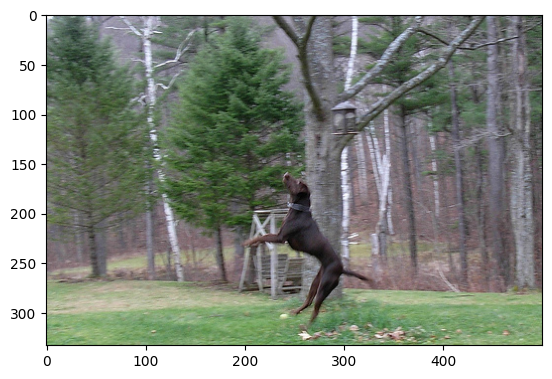

black dog is running through the grass


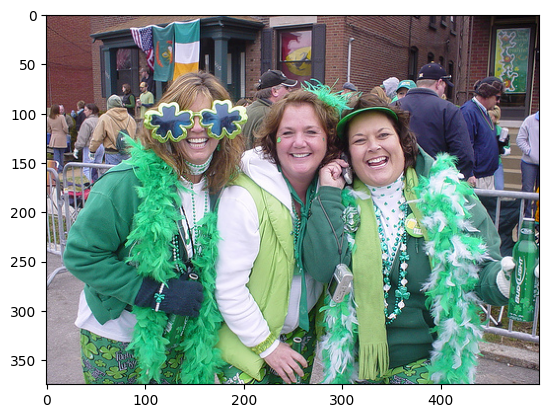

two girls in traditional clothes are smiling and holding hands


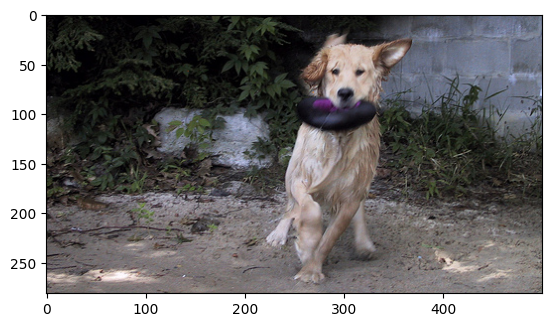

dog runs through the grass


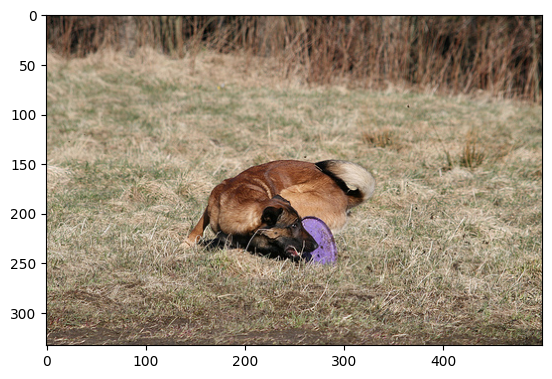

two brown dogs are playing together and fighting


In [ ]:
for i in range(0,20):
  print_output(i)

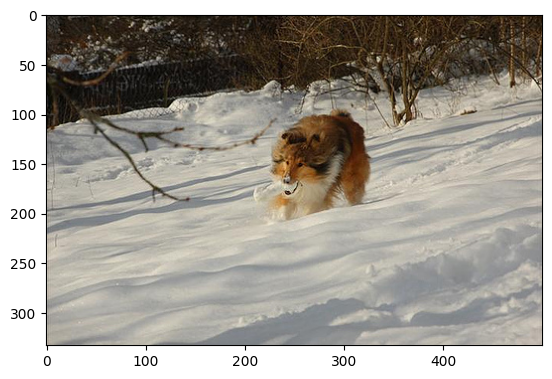

white dog is running through the snow


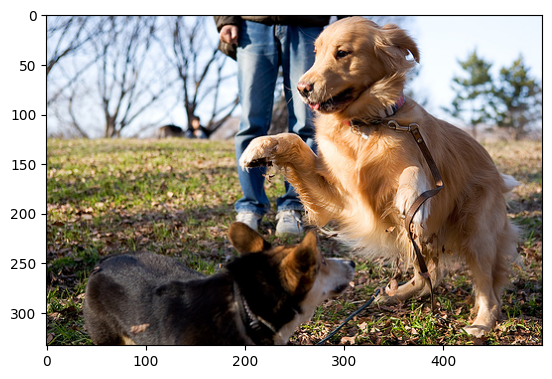

two brown and white dogs are running through the grass


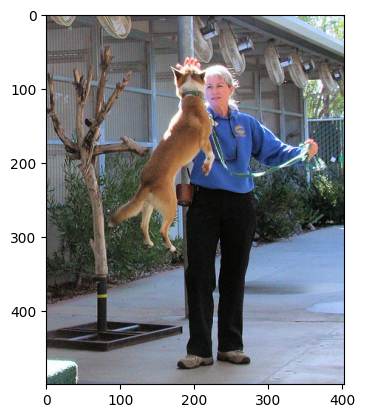

boy in red shirt is standing in front of van


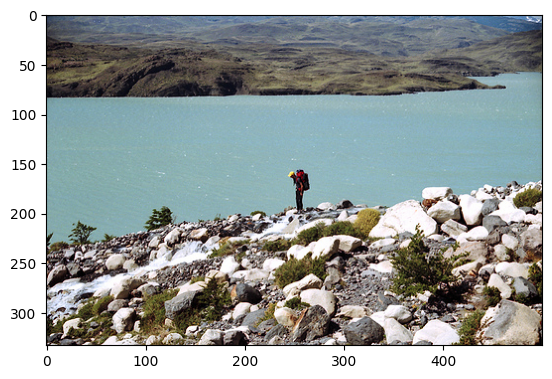

two people stand on the rocks near the ocean


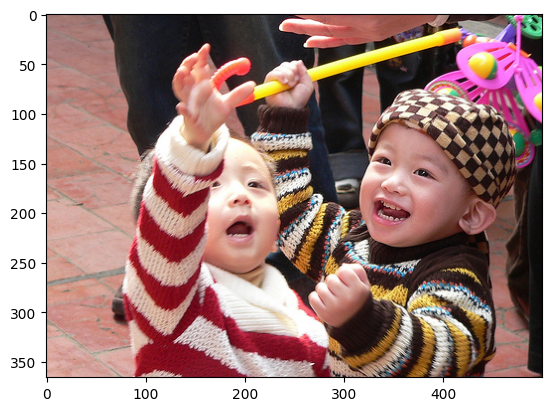

little boy in red shirt plays with red ball


In [50]:
# printing outputs using beam search decode

def beam_search_decode_print_output(z):
#z=4
  pic = list(test_features.keys())[z]
  image = test_features[pic].reshape((1,2048))
  x=plt.imread(images+pic)
  plt.imshow(x)
  plt.show()
  print(beam_search_predictions(image))

for i in range(0,5):
  beam_search_decode_print_output(i)

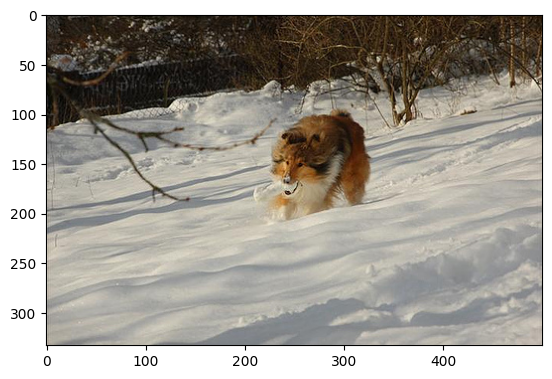

white dog is running through the snow


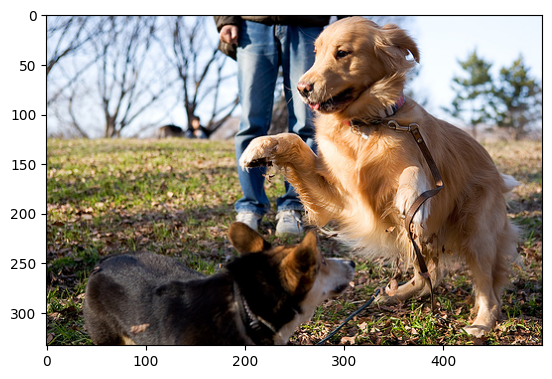

two brown and white dogs are running through the grass


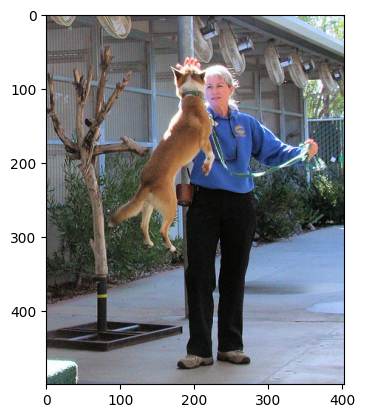

boy in red shirt is standing in front of van


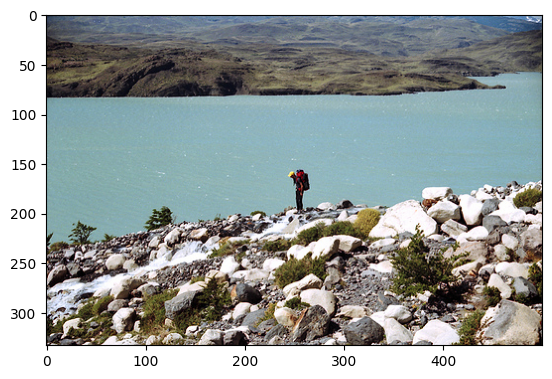

two people stand on the rocks near the ocean


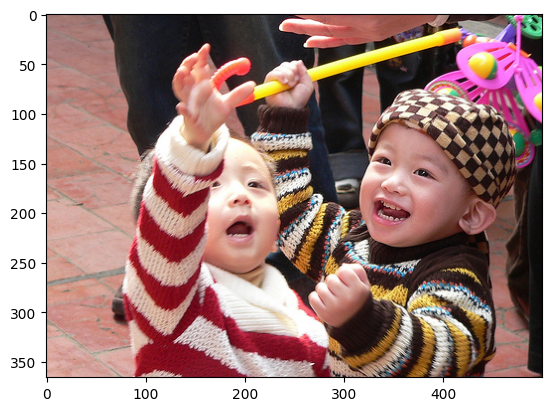

little boy in red shirt plays with red ball


In [53]:
# printing outputs using diverse beam search methodology

def diverse_beam_search_predictions_print_output(z):
#z=4
  pic = list(test_features.keys())[z]
  image = test_features[pic].reshape((1,2048))
  x=plt.imread(images+pic)
  plt.imshow(x)
  plt.show()
  print(beam_search_predictions(image))

for i in range(0,5):
  diverse_beam_search_predictions_print_output(i)

In [51]:
def bleu_score(hypotheses, references):
	return nltk.translate.bleu_score.corpus_bleu(references, hypotheses)

def test_model_on_images(weight, img_dir, beam_size = 3):
	imgs = []
	captions = {}
	hypotheses=[]
	references = []
	for img_name in imgs:
		hypothesis = captions[img_name]
		reference = image_captions_pair[img_name]
		hypotheses.append(hypothesis)
		references.append(reference)

	return bleu_score(hypotheses, references)

In [54]:
BLEUaccuracy()


BLeU Accuracy Achieved: 87%
